<a href="https://colab.research.google.com/github/Paulo-CJ-Neto/YOLO_OpenCV/blob/main/YOLO_e_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import time
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
path = '/content/gdrive/MyDrive/meu_YOLO/modelo_YOLOv4.zip'
zip_object = zipfile.ZipFile(file=path, mode='r')
zip_object.extractall('./')
zip_object.close()

In [ ]:
labels_path = os.path.sep.join(['/content/cfg', 'coco.names'])
labels_path

'/content/cfg/coco.names'

In [ ]:
LABELS = open(labels_path).read().strip().split('\n')
print(LABELS)

['person', 'bicycle', 'car', 'motorbike', 'aeroplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'sofa', 'pottedplant', 'bed', 'diningtable', 'toilet', 'tvmonitor', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [ ]:
len(LABELS)

80

In [ ]:
LABELS[16]

'dog'

In [ ]:
weights_path = os.path.sep.join(['/content', 'yolov4.weights'])
config_path = os.path.sep.join(['/content/cfg', 'yolov4.cfg'])
weights_path, config_path

('/content/yolov4.weights', '/content/cfg/yolov4.cfg')

In [ ]:
net = cv2.dnn.readNet(config_path, weights_path)

In [ ]:
net

< cv2.dnn.Net 0x785a7e821630>

In [ ]:
COLORS = np.random.randint(0, 255, size=(len(LABELS), 3), dtype='uint8')

In [ ]:
ln = net.getLayerNames()
print('Todas as camadas')
print(ln)
print('Total de camadas do modelo: ', str(len(ln)))

Todas as camadas
('conv_0', 'bn_0', 'mish_1', 'conv_1', 'bn_1', 'mish_2', 'conv_2', 'bn_2', 'mish_3', 'identity_3', 'conv_4', 'bn_4', 'mish_5', 'conv_5', 'bn_5', 'mish_6', 'conv_6', 'bn_6', 'mish_7', 'shortcut_7', 'conv_8', 'bn_8', 'mish_9', 'concat_9', 'conv_10', 'bn_10', 'mish_11', 'conv_11', 'bn_11', 'mish_12', 'conv_12', 'bn_12', 'mish_13', 'identity_13', 'conv_14', 'bn_14', 'mish_15', 'conv_15', 'bn_15', 'mish_16', 'conv_16', 'bn_16', 'mish_17', 'shortcut_17', 'conv_18', 'bn_18', 'mish_19', 'conv_19', 'bn_19', 'mish_20', 'shortcut_20', 'conv_21', 'bn_21', 'mish_22', 'concat_22', 'conv_23', 'bn_23', 'mish_24', 'conv_24', 'bn_24', 'mish_25', 'conv_25', 'bn_25', 'mish_26', 'identity_26', 'conv_27', 'bn_27', 'mish_28', 'conv_28', 'bn_28', 'mish_29', 'conv_29', 'bn_29', 'mish_30', 'shortcut_30', 'conv_31', 'bn_31', 'mish_32', 'conv_32', 'bn_32', 'mish_33', 'shortcut_33', 'conv_34', 'bn_34', 'mish_35', 'conv_35', 'bn_35', 'mish_36', 'shortcut_36', 'conv_37', 'bn_37', 'mish_38', 'conv_38

In [ ]:
print('camadas de saida')
print(net.getUnconnectedOutLayers())

camadas de saida
[327 353 379]


In [ ]:
ln = [ln[i - 1] for i in net.getUnconnectedOutLayers()]
print(ln)

['yolo_139', 'yolo_150', 'yolo_161']


In [ ]:
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16, 10)
  plt.axis('off')
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

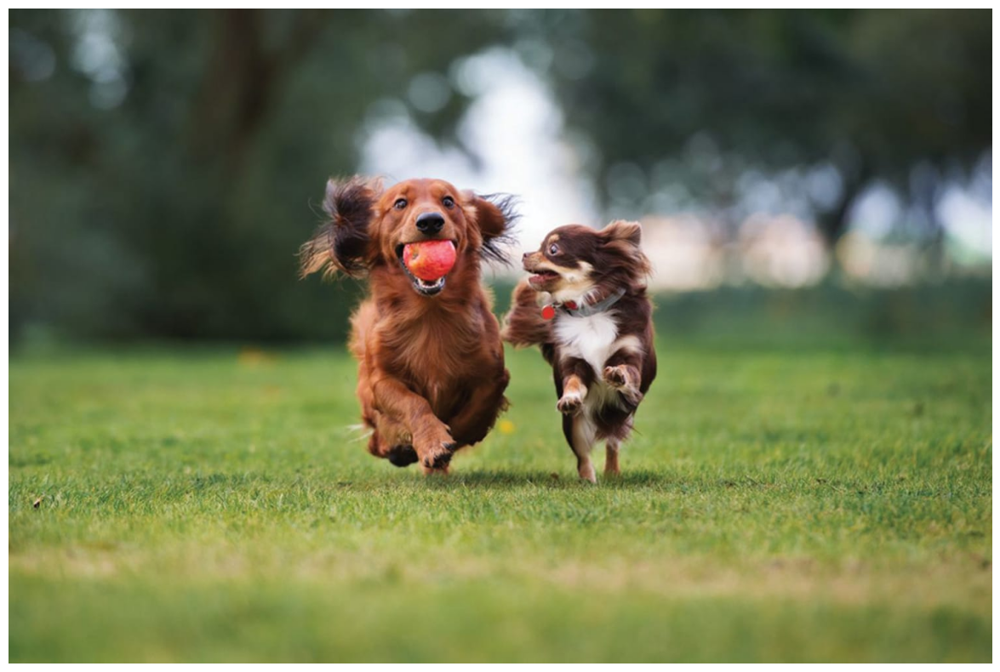

Altura: 1000
Largura: 1500


In [ ]:
imagem = cv2.imread('/content/gdrive/MyDrive/YOLO/imagens/cachorros02.jpg')
mostrar(imagem)
imagem_cp = imagem.copy()
(H, W) = imagem.shape[:2]
print("Altura: " + str(H) + "\nLargura: " + str(W))

In [ ]:
inicio = time.time()

blob = cv2.dnn.blobFromImage(imagem, 1 / 255.0, (416, 416), swapRB = True, crop = False)
net.setInput(blob)
layer_outputs = net.forward(ln)

termino = time.time()
print('YOLO levou {:.2f} segundos'.format(termino - inicio))

YOLO levou 3.17 segundos


In [ ]:
 _threshold = 0.5
 threshold_NMS = 0.3
 caixas = []
 confiancas = []
 IDclasses = []

In [ ]:
len(layer_outputs)

3

In [ ]:
layer_outputs[0], len(layer_outputs[0])

(array([[0.00766477, 0.00975949, 0.01918749, ..., 0.        , 0.        ,
         0.        ],
        [0.01245104, 0.01600843, 0.02908834, ..., 0.        , 0.        ,
         0.        ],
        [0.01483305, 0.01517676, 0.0546473 , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.9907935 , 0.9902123 , 0.02142861, ..., 0.        , 0.        ,
         0.        ],
        [0.98636   , 0.983406  , 0.03091256, ..., 0.        , 0.        ,
         0.        ],
        [0.98306555, 0.9849669 , 0.05337045, ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 8112)

In [ ]:
layer_outputs[1]

array([[0.0287916 , 0.03163319, 0.07753491, ..., 0.        , 0.        ,
        0.        ],
       [0.02924497, 0.03154305, 0.13354048, ..., 0.        , 0.        ,
        0.        ],
       [0.02770558, 0.03161193, 0.1358369 , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.9671856 , 0.96584755, 0.07566552, ..., 0.        , 0.        ,
        0.        ],
       [0.9642939 , 0.96599996, 0.08575749, ..., 0.        , 0.        ,
        0.        ],
       [0.9649651 , 0.96558   , 0.09254209, ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [ ]:
layer_outputs[2], layer_outputs[2][0], len(layer_outputs[2][0])

(array([[0.06604481, 0.06857841, 0.23560458, ..., 0.        , 0.        ,
         0.        ],
        [0.05934994, 0.0684526 , 0.35956126, ..., 0.        , 0.        ,
         0.        ],
        [0.03728739, 0.056093  , 0.71281284, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.93470675, 0.93128896, 0.18813133, ..., 0.        , 0.        ,
         0.        ],
        [0.9385062 , 0.93424773, 0.2626027 , ..., 0.        , 0.        ,
         0.        ],
        [0.9557555 , 0.9567792 , 0.56845963, ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 array([6.6044807e-02, 6.8578415e-02, 2.3560458e-01, 2.1728383e-01,
        1.6796128e-06, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0

In [ ]:
np.argmax(np.array([0.10, 0.80, 0.10]))

1

In [ ]:
teste = np.array([0.10, 0.80, 0.10])

In [ ]:
teste[1]

0.8

In [ ]:
for output in layer_outputs:
  for detection in output:

    scores = detection[5:]
    classeID = np.argmax(scores)
    confianca = scores[classeID]

    if confianca > _threshold:
      print('scores: ' + str(scores))
      print('classe mais provável: ' + str(classeID))
      print('confiança: ' + str(confianca))

      caixa = detection[0:4] * np.array([W, H, W, H])
      (centerX, centerY, width, height) = caixa.astype('int')

      x = int(centerX - (width / 2))
      y = int(centerY - (height / 2))

      caixas.append([x, y, int(width), int(height)])
      confiancas.append(float(confianca))
      IDclasses.append(classeID)

scores: [0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.9754097 0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.       ]
classe mais provável: 16
confiança: 0.9754097
scores: [0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.9813949 0.        0.        0.        0.
 0.       

In [ ]:
print(confiancas), len(caixas)

[0.9754096865653992, 0.98139488697052, 0.5843062400817871, 0.7508532404899597, 0.7460794448852539, 0.9840341806411743, 0.9888637065887451, 0.9884310960769653, 0.5092489719390869, 0.9928240776062012, 0.9926968812942505, 0.9902258515357971, 0.9841700792312622]


(None, 13)

In [ ]:
print(IDclasses), len(IDclasses)

[16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16]


(None, 13)

In [ ]:
objs = cv2.dnn.NMSBoxes(caixas, confiancas, _threshold, threshold_NMS)

In [ ]:
objs

array([ 9, 11], dtype=int32)

In [ ]:
print(objs.flatten())

[ 9 11]


In [ ]:
confiancas[7], confiancas[15], confiancas[11]

IndexError: ignored

In [ ]:
confiancas[0]

0.9754096865653992

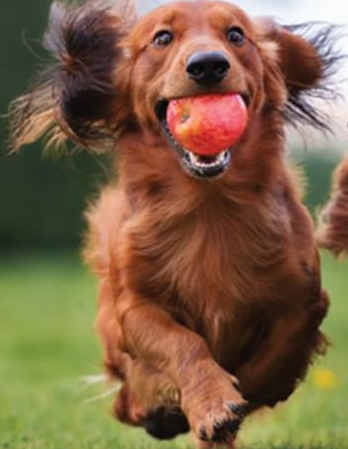

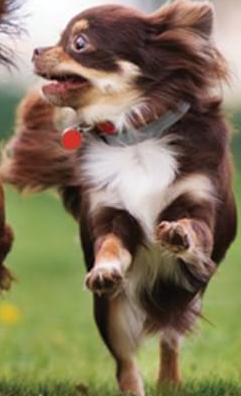

In [ ]:
if len(objs) > 0:
  for i in objs.flatten():
    (x, y) = (caixas[i][0], caixas[i][1])
    (w, h) = (caixas[i][2], caixas[i][3])

    objeto = imagem_cp[y:y + h, x:x + w]
    cv2_imshow(objeto)

    cor = [int(c) for c in COLORS[IDclasses[i]]]

    cv2.rectangle(imagem, (x, y), (x + w, y + h), cor, 2)
    texto = "{}: {:.4f}".format(LABELS[IDclasses[i]], confiancas[i])
    cv2.putText(imagem, texto, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, cor, 2)

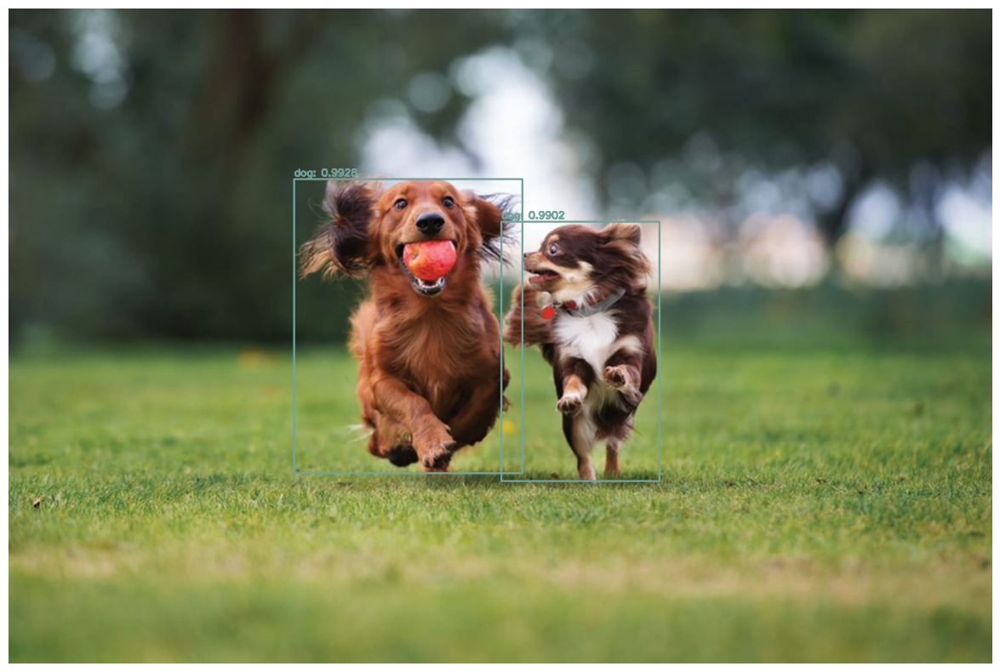

In [ ]:
mostrar(imagem)

In [ ]:
cv2.imwrite('resultado.jpg', imagem)

True

In [ ]:
!cp ./resultado.jpg /content/gdrive/MyDrive/meu_YOLO/resultados_yolo/cachorro_opencv.jpg

In [ ]:
imagem.shape

(1000, 1500, 3)

In [ ]:
proporcao = imagem.shape[1] / imagem.shape[0]
proporcao

1.5

In [ ]:
def redimensionar(imagem, largura_maxima = 600):
  if imagem.shape[1] > largura_maxima:
    proporcao = imagem.shape[1] / imagem.shape[0]
    imagem_largura = largura_maxima
    imagem_altura = int(imagem_largura / proporcao)
  else:
    imagem_largura = imagem.shape[1]
    imagem_altura = imagem.shape(0)

  imagem = cv2.resize(imagem, (imagem_largura, imagem_altura))
  return imagem

In [ ]:
imagem = redimensionar(imagem)

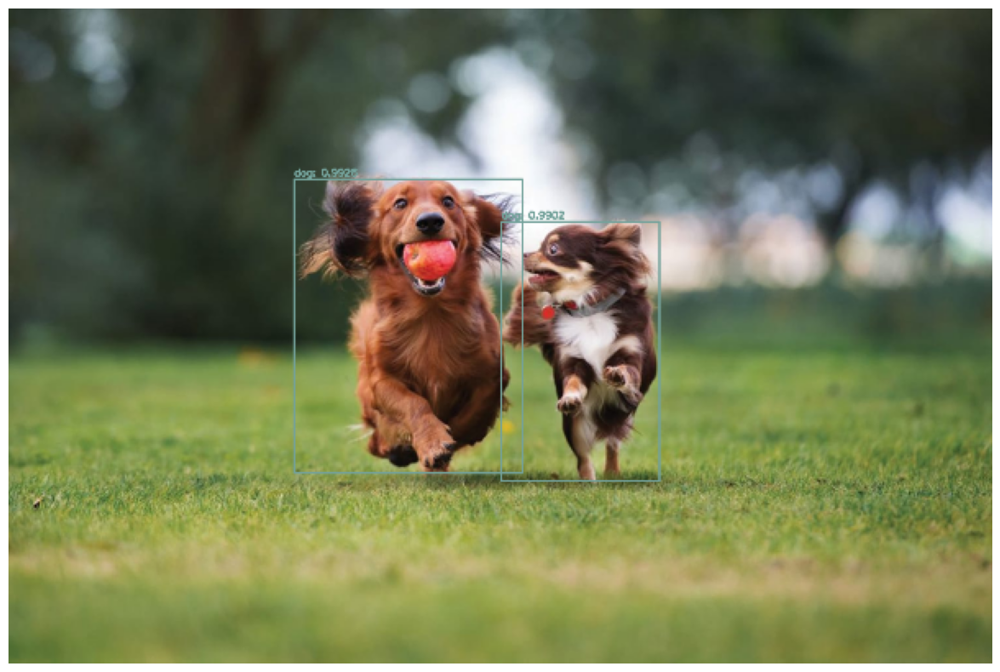

Altura: 400
Largura: 600


In [ ]:
mostrar(imagem)
(H, W) = imagem.shape[:2]
imagem_cp = imagem.copy()
print('Altura: ' + str(H) + '\nLargura: ' + str(W))

In [ ]:
def blob_imagem(net, imagem, mostrar_texto=True):
  inicio = time.time()

  blob = cv2.dnn.blobFromImage(imagem, 1 / 255.0, (416, 416), swapRB = True, crop = False)
  net.setInput(blob)
  layerOutputs = net.forward(ln)

  termino = time.time()

  if mostrar_texto:
    print('YOLO levou {:.2f} segundos'.format(termino - inicio))

  return net, imagem, layerOutputs

In [ ]:
net, imagem, layerOutputs = blob_imagem(net, imagem)

YOLO levou 1.92 segundos


In [ ]:
def deteccoes(detection, _threshold, caixas, confiancas, IDclasses):
  scores = detection[5:]
  classeID = np.argmax(scores)
  confianca = scores[classeID]

  if confianca > _threshold:
    caixa = detection[0:4] * np.array([W, H, W, H])
    (centerX, centerY, width, height) = caixa.astype('int')
    x = int(centerX - (width / 2))
    y = int(centerY - (height / 2))

    caixas.append([x, y, int(width), int(height)])
    confiancas.append(float(confianca))
    IDclasses.append(classeID)

  return caixas, confiancas, IDclasses

In [ ]:
for output in layer_outputs:
  for detection in output:
    caixas, confiancas, IDclasses = deteccoes(detection, _threshold, caixas, confiancas, IDclasses)

In [ ]:
caixas.clear()
confiancas.clear()
IDclasses.clear()

In [ ]:
print(caixas)
print(confiancas)
print(IDclasses)

[[174, 102, 138, 183], [174, 103, 138, 182], [296, 128, 98, 163], [293, 129, 102, 163], [293, 128, 101, 164], [303, 127, 91, 165], [302, 128, 93, 164], [303, 128, 92, 164], [302, 137, 93, 158], [173, 104, 139, 179], [175, 102, 138, 181], [300, 130, 96, 158], [299, 128, 98, 161]]
[0.9754096865653992, 0.98139488697052, 0.5843062400817871, 0.7508532404899597, 0.7460794448852539, 0.9840341806411743, 0.9888637065887451, 0.9884310960769653, 0.5092489719390869, 0.9928240776062012, 0.9926968812942505, 0.9902258515357971, 0.9841700792312622]
[16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16]


In [ ]:
len(caixas)

13

In [ ]:
objs = cv2.dnn.NMSBoxes(caixas, confiancas, _threshold, threshold_NMS)

In [ ]:
print(str(len(objs)))

2


In [ ]:
def check_negativo(n):
  if (n < 0):
    return 0
  else:
    return n

def funcoes_imagem(imagem, i, confiancas, caixas, COLORS, LABELS, mostrar_texto=True):
  (x, y) = (caixas[i][0], caixas[i][1])
  (w, h) = (caixas[i][2], caixas[i][3])
  cor = [int(c) for c in COLORS[IDclasses[i]]]
  cv2.rectangle(imagem, (x,y), (x +w, y + h), cor, 2)
  texto = "{}: {:.4f}".format(LABELS[IDclasses[i]], confiancas[i])
  if mostrar_texto:
    print("> " + texto)
    print(x,y,w,h)
  cv2.putText(imagem, texto, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, cor, 2)

  return imagem, x, y, w, h

> dog: 0.9928
173 104 139 179


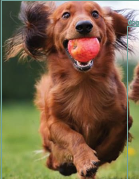

> dog: 0.9902
300 130 96 158


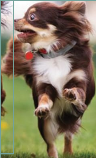

In [ ]:
if len(objs) > 0:
  for i in objs.flatten():
    imagem, x, y, w, h = funcoes_imagem(imagem, i, confiancas, caixas, COLORS, LABELS)
    objeto = imagem_cp[y:y + h, x: x + w]
    cv2_imshow(objeto)

In [ ]:
path = '/content/gdrive/MyDrive/YOLO/imagens/fotos_teste.zip'
zip_object = zipfile.ZipFile(file = path, mode = 'r')
zip_object.extractall('./')
zip_object.close()

In [ ]:
diretorio_fotos = 'fotos_teste/'
caminhos = [os.path.join(diretorio_fotos, f) for f in os.listdir(diretorio_fotos)]
print(caminhos)

['fotos_teste/gato03.jpg', 'fotos_teste/cachorros.jpg', 'fotos_teste/gato02.jpg', 'fotos_teste/gato04.jpg', 'fotos_teste/person.jpg', 'fotos_teste/dog.jpg', 'fotos_teste/img-canecas.jpg', 'fotos_teste/cachorros02.jpg']


YOLO levou 1.29 segundos
Pessoas detectadas na imagem fotos_teste/gato03.jpg: 0


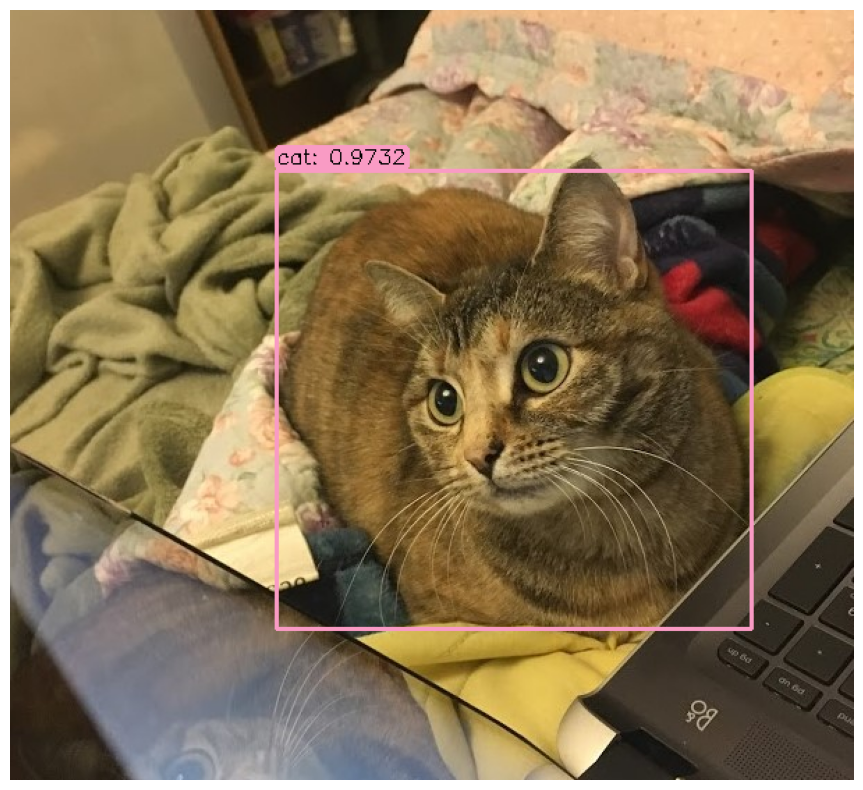

YOLO levou 2.19 segundos
Pessoas detectadas na imagem fotos_teste/cachorros.jpg: 0


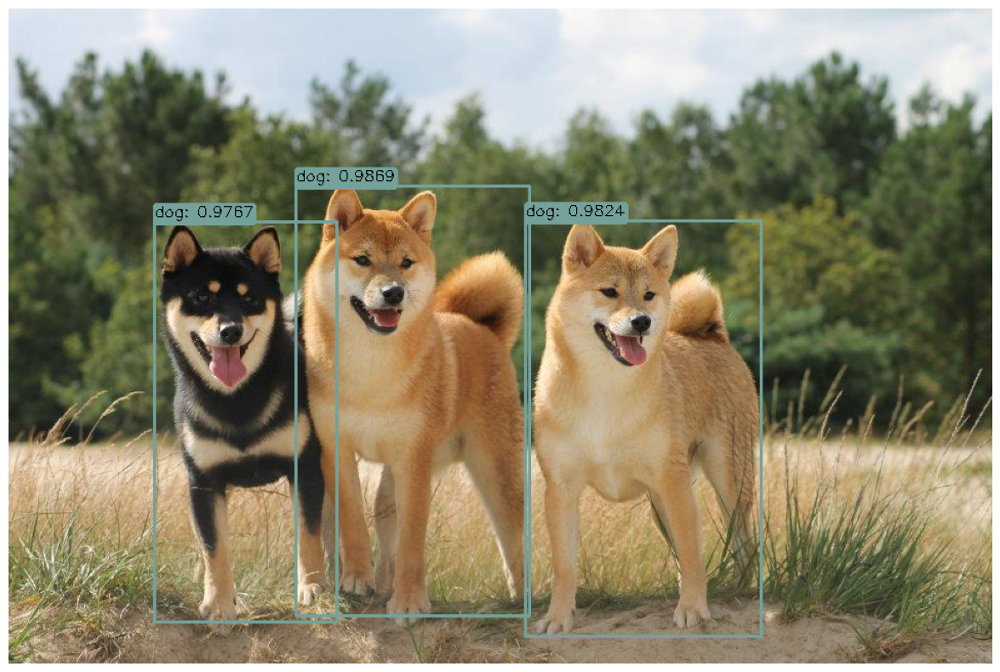

YOLO levou 2.03 segundos
Pessoas detectadas na imagem fotos_teste/gato02.jpg: 0


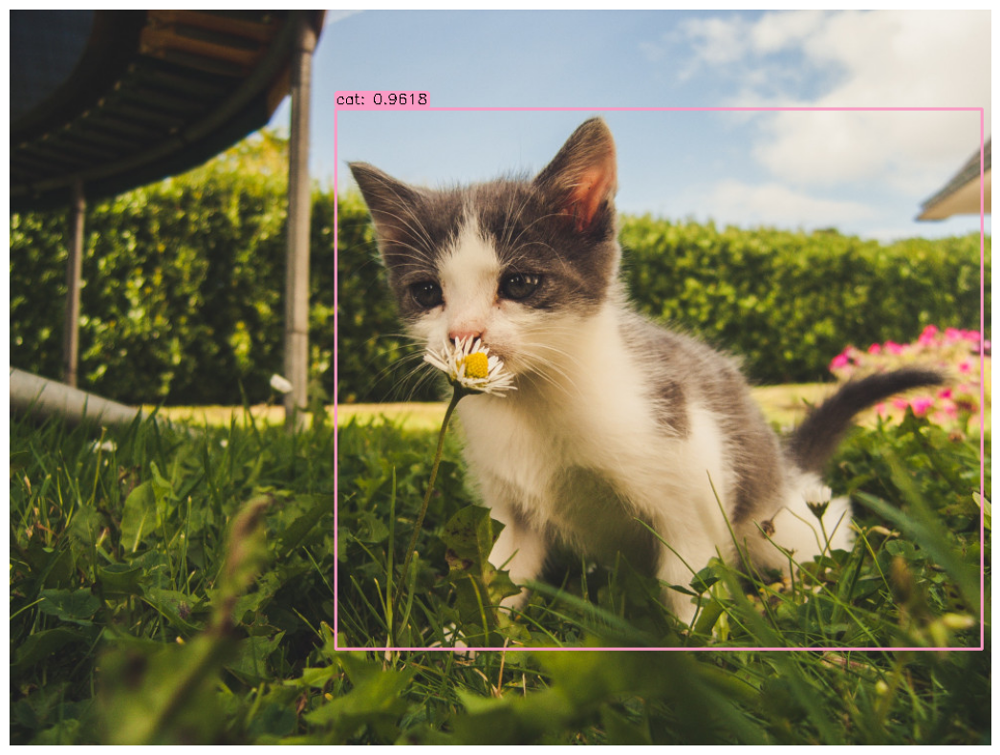

YOLO levou 1.51 segundos
Pessoas detectadas na imagem fotos_teste/gato04.jpg: 0


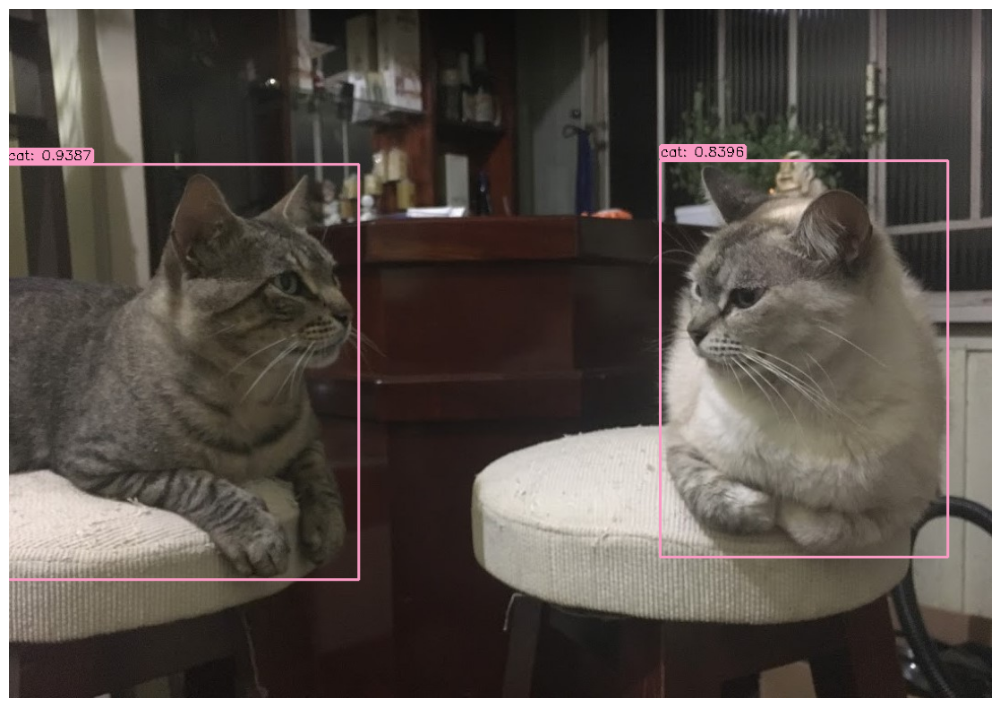

YOLO levou 1.53 segundos
Pessoas detectadas na imagem fotos_teste/person.jpg: 1


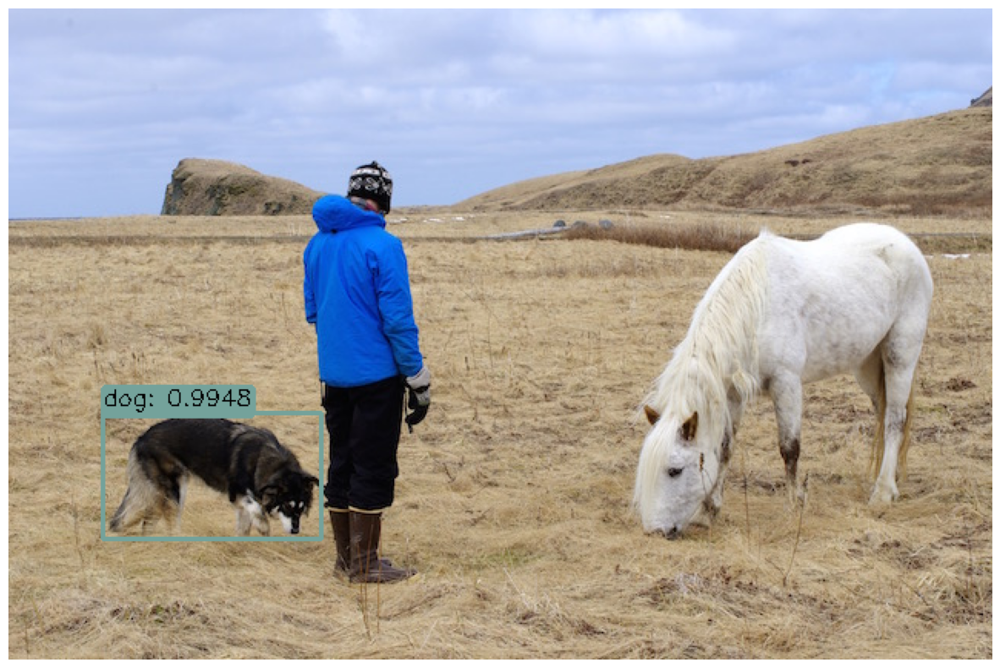

YOLO levou 1.49 segundos
Pessoas detectadas na imagem fotos_teste/dog.jpg: 0


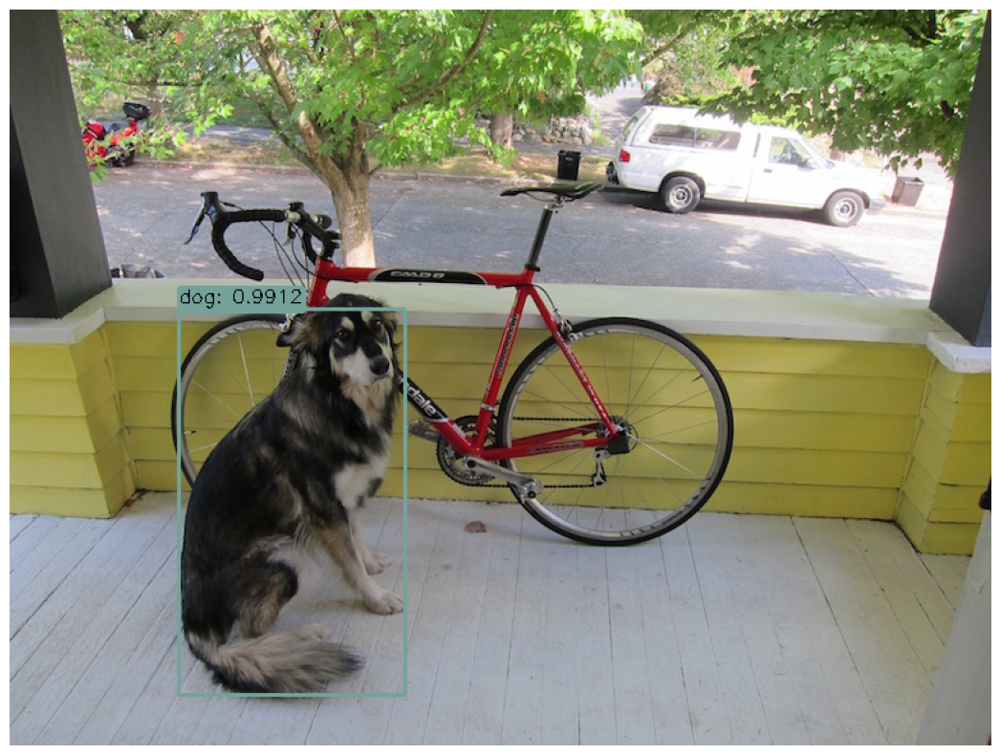

YOLO levou 1.54 segundos
Pessoas detectadas na imagem fotos_teste/img-canecas.jpg: 0


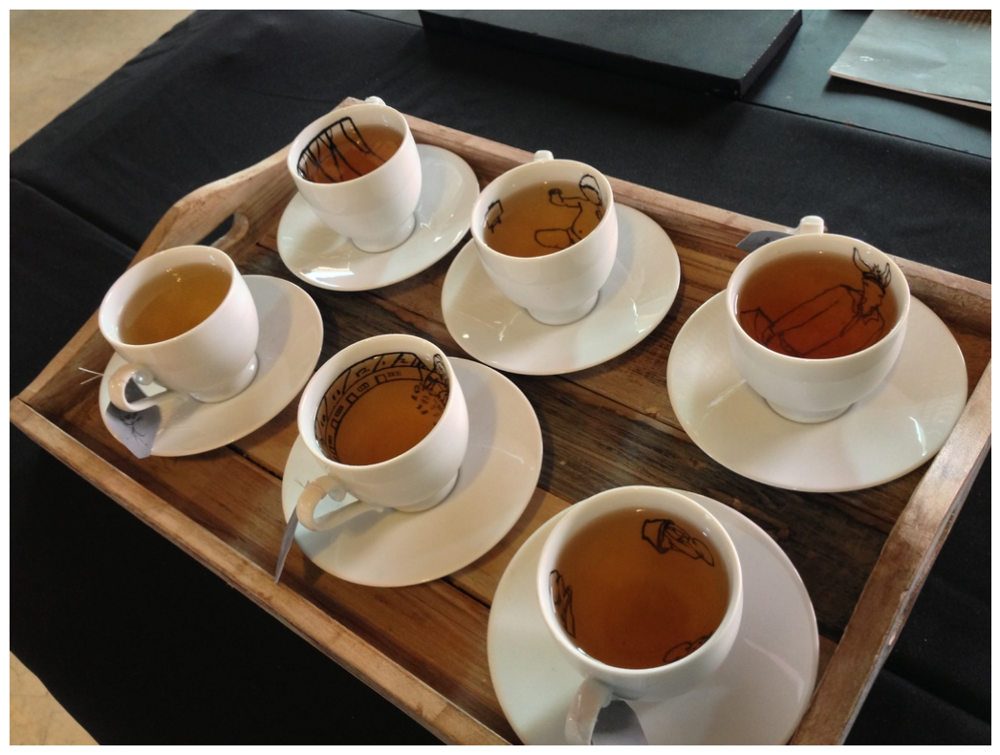

YOLO levou 2.26 segundos
Pessoas detectadas na imagem fotos_teste/cachorros02.jpg: 0


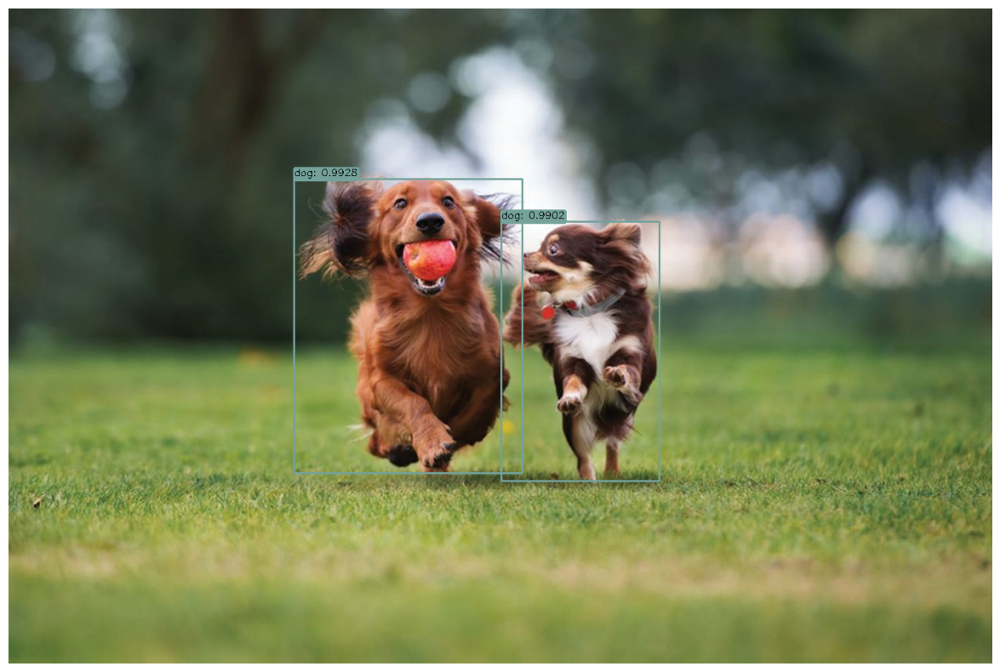

In [ ]:
classes = ['dog', 'cat']

contagem = 0
contagem_total = 0

for caminho_imagem in caminhos:
  try:
    imagem = cv2.imread(caminho_imagem)
    (H, W) = imagem.shape[:2]
  except:
    print('erro ao carregar a imagem ->' + caminho_imagem)
    continue

  contagem = 0

  imagem_cp = imagem.copy()
  net, imagem, layer_outputs = blob_imagem(net, imagem)

  caixas = []
  confiancas = []
  IDclasses = []

  for output in layer_outputs:
    for detection in output:
      caixas, confiancas, IDclasses = deteccoes(detection, _threshold, caixas, confiancas, IDclasses)

  objs = cv2.dnn.NMSBoxes(caixas, confiancas, _threshold, threshold_NMS)

  if len(objs) > 0:
    for i in objs.flatten():

      if LABELS[IDclasses[i]] =='person':
        contagem += 1
        contagem_total += 1

      if LABELS[IDclasses[i]] in classes:
        imagem, x, y, w, h = funcoes_imagem_v2(imagem, i, confiancas, caixas, COLORS, LABELS, mostrar_texto=False)
        objeto = imagem_cp[y:y + h, x:x + w]

  print('Pessoas detectadas na imagem ' + str(caminho_imagem) + ': ' + str(contagem))
  mostrar (imagem)


In [ ]:
print('Contagem total de pessoas : ' + str(contagem_total))

Contagem total de pessoas : 1


In [ ]:
def funcoes_imagem_v2(imagem, i, confiancas, caixas, COLORS, LABELS, mostrar_texto=True):
  (x, y) = (caixas[i][0], caixas[i][1])
  (w, h) = (caixas[i][2], caixas[i][3])

  cor = [int(c) for c in COLORS[IDclasses[i]]]

  fundo = np.full((imagem.shape), (0,0,0), dtype=np.uint8)

  texto = "{}: {:.4f}".format(LABELS[IDclasses[i]], confiancas[i])

  cv2.putText(fundo, texto, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 2)

  fx, fy, fw, fh = cv2.boundingRect(fundo[:,:,2])

  cv2.rectangle(imagem, (x, y), (x + w, y + h), cor, 2)

  cv2.rectangle(imagem, (fx, fy), (fx + fw, fy + fh), cor, -1)
  cv2.rectangle(imagem, (fx, fy), (fx + fw, fy +fh), cor, 3)
  cv2.putText(imagem, texto, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1)

  if mostrar_texto:
    print("> " + texto)
    print(x,y,w,h)

  return imagem, x, y, w, h